In [20]:
%pip install numpy scipy

  Using cached scipy-1.13.1-cp39-cp39-macosx_12_0_arm64.whl.metadata (60 kB)
Using cached scipy-1.13.1-cp39-cp39-macosx_12_0_arm64.whl (30.3 MB)
Note: you may need to restart the kernel to use updated packages.


In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Initializing 
- $\hat{V}, \hat{K}, \hat{H}$
- Found Ground state $\psi$

In [ ]:
# Environment variables
hbar = m_e = e = 1
N = 2048
L  = 200
dx = L / N

T_laser = 110
dt =  150
T_total = 12 * T_laser # 12 Cycles

In [29]:
t_array = np.arange(0, T_total, dt)
t_array

array([   0,  150,  300,  450,  600,  750,  900, 1050, 1200])

In [8]:
x_grid = np.linspace(-L/2, L/2, N)
x_grid

array([-100.        ,  -99.90229604,  -99.80459209, ...,   99.80459209,
         99.90229604,  100.        ])

In [ ]:
# Laser field sample


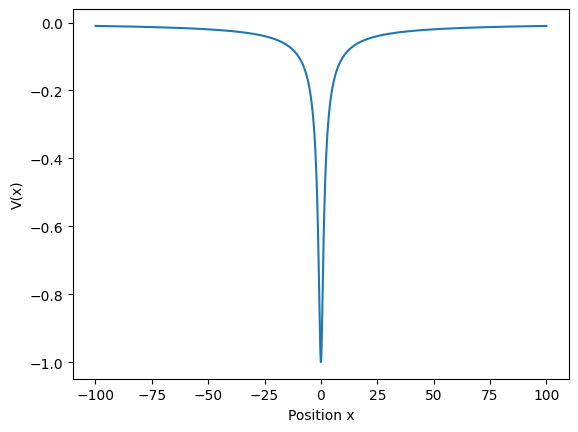

In [ ]:
# Potential Variables
def V(x):
    a = 1 # softening parameter
    return - (1/np.sqrt(x**2 + a**2))


# Potential for all points 
V_x = V(x_grid)
plt.xlabel("Position x")
plt.ylabel("V(x)")
plt.plot(x_grid, V_x,)

In [ ]:
# Diagonalizing the Potential vector into N x N
Vo = np.diag(V_x.flatten())
Vo

array([[-0.0099995 ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , -0.01000928,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        , -0.01001908, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., -0.01001908,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
        -0.01000928,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.0099995 ]])

In [ ]:
def laplacian_matrix(N):
    # main diagonal of -2's
    main_diag = -2 * np.ones(N)
    
    # off diagonals of +1's
    off_diag = np.ones(N-1)
    
    # build the tridiagonal matrix
    A = np.diag(main_diag) + np.diag(off_diag, k=1) + np.diag(off_diag, k=-1)
    return A

C = - (hbar **2) / (2 * m_e * dx ** 2)
# Kinetic Energy operator
Ko = C * laplacian_matrix(len(x_grid))

array([[104.8576, -52.4288,  -0.    , ...,  -0.    ,  -0.    ,  -0.    ],
       [-52.4288, 104.8576, -52.4288, ...,  -0.    ,  -0.    ,  -0.    ],
       [ -0.    , -52.4288, 104.8576, ...,  -0.    ,  -0.    ,  -0.    ],
       ...,
       [ -0.    ,  -0.    ,  -0.    , ..., 104.8576, -52.4288,  -0.    ],
       [ -0.    ,  -0.    ,  -0.    , ..., -52.4288, 104.8576, -52.4288],
       [ -0.    ,  -0.    ,  -0.    , ...,  -0.    , -52.4288, 104.8576]])

In [19]:
# Hamiltonian 
H_static = Vo + Ko
H_static

array([[104.8476005 , -52.4288    ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [-52.4288    , 104.84759072, -52.4288    , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        , -52.4288    , 104.84758092, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ..., 104.84758092,
        -52.4288    ,   0.        ],
       [  0.        ,   0.        ,   0.        , ..., -52.4288    ,
        104.84759072, -52.4288    ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
        -52.4288    , 104.8476005 ]])

In [21]:
# Finding the Ground state wavefunction

from scipy.linalg import eigh

eigenvalues, eigenvectors = eigh(H_static)
ground_state_index = np.argmin(eigenvalues)
psi_ground = eigenvectors[:, ground_state_index]
psi_initial = psi_ground / np.linalg.norm(psi_ground)

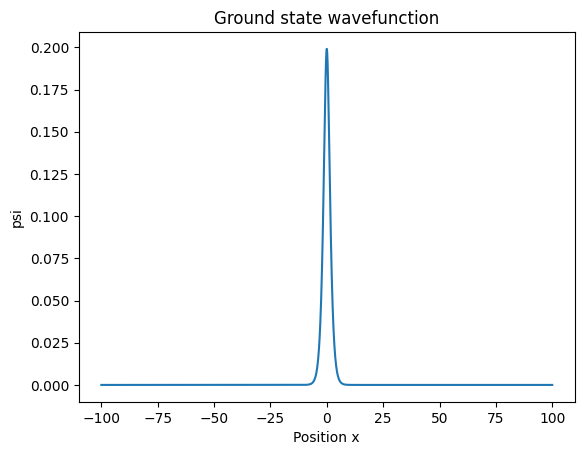

In [23]:
plt.xlabel("Position x")
plt.ylabel("psi")
plt.title("Ground state wavefunction")
plt.plot(x_grid, psi_initial)

# Time evolution of $\psi$ using Crank Nicholson method

this is done use the following Discrete Crank nicholson equation

$$
\psi(t+\Delta t) = (1 + \frac{i \Delta t}{2 \bar{h}} \hat{ H})^{-1} \cdot  (1 - \frac{i \Delta t}{2 \bar{h}} \hat{ H}) \cdot \psi (t)
$$

assuming 

$A = 1 + \frac{i \Delta t}{2 \bar{h}} \hat{ H}$  

and

$B = 1 - \frac{i \Delta t}{2 \bar{h}} \hat{ H}$ 



Also 
$$
H_t = H_{static} + H_{laser}
$$

In [30]:
# total Hamiltonian
H_t = H_static

In [31]:
# find A and B
factor = 1j * dt / (2 * hbar)
I = np.identity(N)
A = I + factor * H_t
B = I - factor * H_t

In [ ]:
A_inv = np.linalg.inv(A)

In [40]:
# Discretized Crank Nicholson Equation
psi = (A_inv @ B) @ psi_initial

/Users/bharatdeleepnair/Desktop/Python/Clone_repos_here/HHG/.venv/lib/python3.9/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/bharatdeleepnair/Desktop/Python/Clone_repos_here/HHG/.venv/lib/python3.9/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


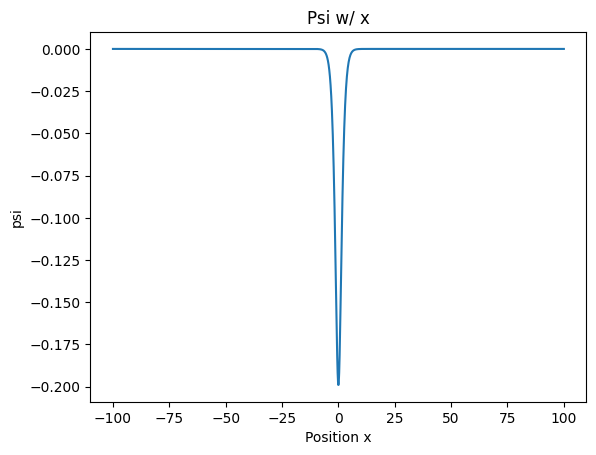

In [41]:
plt.xlabel("Position x")
plt.ylabel("psi")
plt.title("Psi w/ x")
plt.plot(x_grid, psi)

In [37]:
psi

array([ 1.31767804e-19-1.79080570e-19j,  3.32607670e-19-2.16221703e-19j,
        3.24157193e-19-4.34382111e-19j, ...,
        3.93533244e-19+7.97493100e-19j,  9.28690149e-20+5.79992576e-19j,
       -8.89508672e-21+2.44608060e-19j])

# Electric Field

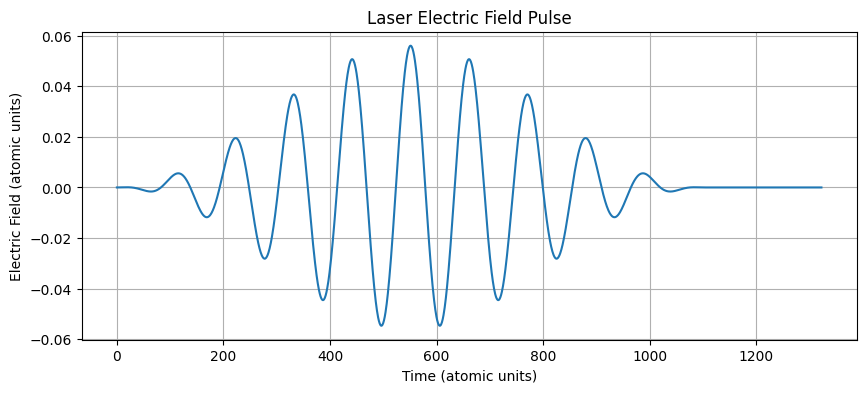

In [43]:
import numpy as np
import matplotlib.pyplot as plt

def laser_field(t, E0, omega0, n_cycles):
    """
    Creates a laser pulse with a sine-squared envelope.

    Args:
        t: Time array or single time point.
        E0: Peak electric field amplitude.
        omega0: Central frequency of the laser.
        n_cycles: Total number of optical cycles in the pulse.

    Returns:
        The electric field value(s) at time(s) t.
    """
    T_cycle = 2 * np.pi / omega0
    pulse_duration = n_cycles * T_cycle

    # Envelope function (sine-squared)
    envelope = np.sin(np.pi * t / pulse_duration)**2

    # Carrier wave (fast oscillation)
    carrier = np.cos(omega0 * t)

    # The field is non-zero only within the pulse duration
    field = E0 * envelope * carrier
    
    # Ensure field is zero outside the pulse duration
    field[t > pulse_duration] = 0
    field[t < 0] = 0
    
    return field

# --- Example Usage ---

# Use the laser parameters from our previous examples (atomic units)
E0 = 0.056       # Peak amplitude
omega0 = 0.057   # Frequency for an 800 nm laser
n_cycles = 10    # A 10-cycle pulse


# Generate the electric field array for the entire simulation
E_array = laser_field(t_array, E0, omega0, n_cycles)

# --- Plot the pulse to verify ---
plt.figure(figsize=(10, 4))
plt.plot(t_array, E_array)
plt.title("Laser Electric Field Pulse")
plt.xlabel("Time (atomic units)")
plt.ylabel("Electric Field (atomic units)")
plt.grid(True)
plt.show()

# Time evolution loop

In [ ]:
# Keep track of evolution
psi_t_list = [psi_initial]
psi_current = psi_initial
x_matrix = np.diag(x_grid)

# Loop through each time step
for i, t in enumerate(t_array):

    # 1. Update the total Hamiltonian for the current time
    #    This includes the laser field E(t)
    E_t = E_array[i]
    H_t = H_static - (e * x_matrix * E_t)

    # 2. Build your A and B matrices for this time step
    A = I + (1j * dt / (2 * hbar)) * H_t
    B = I - (1j * dt / (2 * hbar)) * H_t

    # 3. Calculate the right-hand side vector
    b_vector = B @ psi_current

    # 4. Solve for the new wavefunction
    psi_next = np.linalg.solve(A, b_vector)

    # 5. Store the result and update for the next iteration
    psi_t_list.append(psi_next)
    psi_current = psi_next

# Animation to see the electron

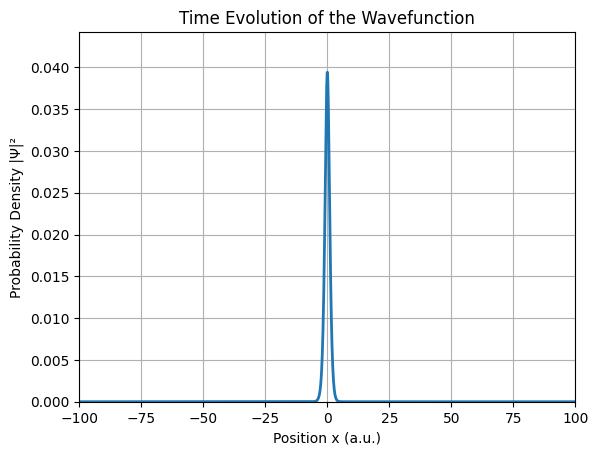

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML # For displaying in a Jupyter notebook

# --- PREPARATION ---

# Assume 'psi_over_time' is your list of wavefunction arrays from the simulation.
# Assume 'x_grid' is your spatial grid array.

# To keep the plot stable, we'll find the maximum probability density
# across the entire simulation to set the y-axis limit.
max_prob_density = 0
for psi in psi_t_list:
    max_prob_density = max(max_prob_density, np.max(np.abs(psi)**2))


# --- SET UP THE PLOT ---

# Create a figure and an axes object
fig, ax = plt.subplots()

# Set the axis limits. x is fixed, y is based on our max probability.
ax.set_xlim(x_grid.min(), x_grid.max())
ax.set_ylim(0, max_prob_density * 1.1) # Add 10% padding

# Add labels
ax.set_xlabel("Position x (a.u.)")
ax.set_ylabel("Probability Density |Ψ|²")
ax.set_title("Time Evolution of the Wavefunction")
ax.grid(True)

# Plot the first frame (the initial state) to get our line object
line, = ax.plot(x_grid, np.abs(psi_t_list[0])**2, lw=2)


# --- ANIMATION FUNCTION ---

# This function will be called for each frame of the animation
def update(frame):
    """Updates the line data for the next frame."""
    
    # Get the wavefunction for the current frame
    psi_t = psi_t_list[frame]
    
    # Calculate the new probability density
    prob_density = np.abs(psi_t)**2
    
    # Update the y-data of our line object
    line.set_ydata(prob_density)
    
    return line,


# --- CREATE AND DISPLAY THE ANIMATION ---

# We can skip frames to make the animation render faster.
# For example, plot every 5th time step.
frame_skip = 5

# Create the animation object
# blit=True means only re-draw the parts that have changed.
anim = FuncAnimation(fig, update, 
                     frames=range(0, len(psi_t_list), frame_skip), 
                     blit=True, interval=30)


# Display the animation in the Jupyter notebook
# This might take a moment to process
HTML(anim.to_jshtml())


# High Harmonic Generation

In [47]:
# First, we need the derivative (gradient) of your potential V(x)
# For V(x) = -1/sqrt(x**2 + a**2), the derivative dV/dx is x / (x**2 + a**2)**(3/2)
a_softening = 1 # The same 'a' from your V(x) function
dV_dx_grid = x_grid / (x_grid**2 + a_softening**2)**(3/2)

# Now, calculate the expectation value for each time step
dipole_accel_t = []
for psi_t in psi_t_list:
    # <Ψ|∇V|Ψ> = ∫ Ψ* (∇V) Ψ dx
    expectation_value = np.sum(np.conj(psi_t) * dV_dx_grid * psi_t) * dx
    
    # Calculate acceleration a(t)
    accel = - (1/m_e) * expectation_value 
    dipole_accel_t.append(accel)

# Convert to a NumPy array for easier handling
dipole_accel_t = np.array(dipole_accel_t)

In [48]:
# Create a Hann window with the same length as our signal
window = np.hanning(len(dipole_accel_t))

# Apply the window to the signal
dipole_accel_windowed = dipole_accel_t * window

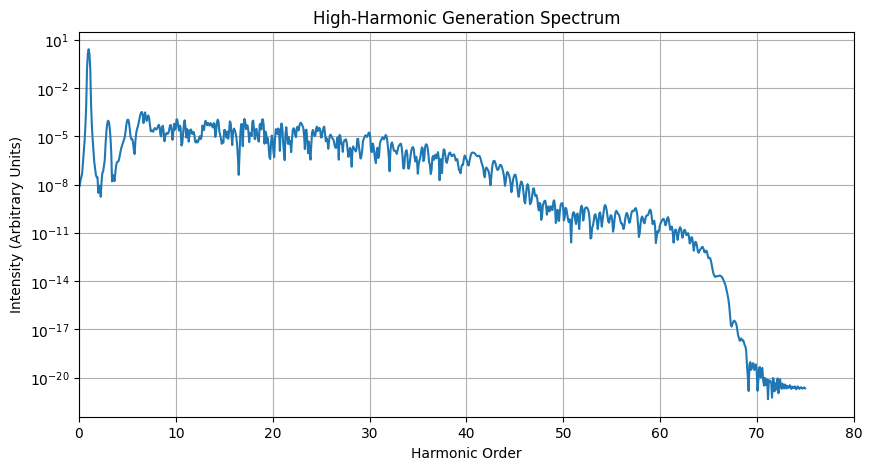

In [49]:
from scipy.fft import fft, fftfreq

# Perform the FFT
spectrum_complex = fft(dipole_accel_windowed)

# Get the corresponding frequencies
# 'dt' is your time step from the simulation
N_t = len(dipole_accel_windowed)
freqs = fftfreq(N_t, d=dt)

# The HHG spectrum is the intensity (absolute value squared)
intensity = np.abs(spectrum_complex)**2

# --- PLOT THE SPECTRUM ---

# We only want to see the positive frequencies
positive_freqs_mask = freqs > 0

# Convert frequency to harmonic order
harmonic_order = freqs[positive_freqs_mask] * (2 * np.pi / omega0)

# Get the corresponding intensity
intensity_positive = intensity[positive_freqs_mask]

plt.figure(figsize=(10, 5))
# Plot intensity on a logarithmic scale to see the full range
plt.semilogy(harmonic_order, intensity_positive)

plt.title("High-Harmonic Generation Spectrum")
plt.xlabel("Harmonic Order")
plt.ylabel("Intensity (Arbitrary Units)")
plt.grid(True)
plt.xlim(0, 80) # Adjust x-limit to zoom in on the harmonics
plt.show()

In [ ]:
\